#### Prepare a classification model using Naive Bayes for salary data. 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
import seaborn as sns
from scipy import stats
import warnings
warnings.filterwarnings("ignore")

### Importing training dataset.

In [3]:
# Importing data
gas_turbine_df = pd.read_csv(r"gas_turbines.csv")

In [4]:
gas_turbine_df

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,6.8594,1007.9,96.799,3.5000,19.663,1059.2,550.00,114.70,10.605,3.1547,82.722
1,6.7850,1008.4,97.118,3.4998,19.728,1059.3,550.00,114.72,10.598,3.2363,82.776
2,6.8977,1008.8,95.939,3.4824,19.779,1059.4,549.87,114.71,10.601,3.2012,82.468
3,7.0569,1009.2,95.249,3.4805,19.792,1059.6,549.99,114.72,10.606,3.1923,82.670
4,7.3978,1009.7,95.150,3.4976,19.765,1059.7,549.98,114.72,10.612,3.2484,82.311
...,...,...,...,...,...,...,...,...,...,...,...
15034,9.0301,1005.6,98.460,3.5421,19.164,1049.7,546.21,111.61,10.400,4.5186,79.559
15035,7.8879,1005.9,99.093,3.5059,19.414,1046.3,543.22,111.78,10.433,4.8470,79.917
15036,7.2647,1006.3,99.496,3.4770,19.530,1037.7,537.32,110.19,10.483,7.9632,90.912
15037,7.0060,1006.8,99.008,3.4486,19.377,1043.2,541.24,110.74,10.533,6.2494,93.227


In [5]:
gas_turbine_df.shape

(15039, 11)

In [6]:
# Checking datatypes
gas_turbine_df.dtypes

AT      float64
AP      float64
AH      float64
AFDP    float64
GTEP    float64
TIT     float64
TAT     float64
TEY     float64
CDP     float64
CO      float64
NOX     float64
dtype: object

In [7]:
# Checking dupliacte values
gas_turbine_df[gas_turbine_df.duplicated()]

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX


In [8]:
# Finding Missing Values
nan_bool_df = gas_turbine_df.isna()

# Use sum() to count the number of True values (NaN) in each column
nan_count_per_column = nan_bool_df.sum()

# If you want the total count of NaN values in the entire DataFrame, you can sum the nan_count_per_column
total_nan_count = nan_count_per_column.sum()

nan_count_per_column

total_nan_count

0

In [9]:
gas_turbine_df.describe()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
count,15039.000000,15039.00000,15039.000000,15039.000000,15039.000000,15039.000000,15039.000000,15039.000000,15039.000000,15039.000000,15039.000000
mean,17.764381,1013.19924,79.124174,4.200294,25.419061,1083.798770,545.396183,134.188464,12.102353,1.972499,68.190934
std,7.574323,6.41076,13.793439,0.760197,4.173916,16.527806,7.866803,15.829717,1.103196,2.222206,10.470586
min,0.522300,985.85000,30.344000,2.087400,17.878000,1000.800000,512.450000,100.170000,9.904400,0.000388,27.765000
25%,11.408000,1008.90000,69.750000,3.723900,23.294000,1079.600000,542.170000,127.985000,11.622000,0.858055,61.303500
50%,18.186000,1012.80000,82.266000,4.186200,25.082000,1088.700000,549.890000,133.780000,12.025000,1.390200,66.601000
75%,23.862500,1016.90000,90.043500,4.550900,27.184000,1096.000000,550.060000,140.895000,12.578000,2.160400,73.935500
max,34.929000,1034.20000,100.200000,7.610600,37.402000,1100.800000,550.610000,174.610000,15.081000,44.103000,119.890000


In [10]:
# Print the names of all columns
print(gas_turbine_df.columns)

Index(['AT', 'AP', 'AH', 'AFDP', 'GTEP', 'TIT', 'TAT', 'TEY', 'CDP', 'CO',
       'NOX'],
      dtype='object')


### Using Box Plot to detect the outliers

Indices of outliers from the box plots:
[8203, 8204, 8207, 8210, 23, 24, 8228, 8229, 8230, 8231, 44, 14719, 64, 8269, 8270, 8271, 8272, 8273, 8274, 8275, 8276, 8279, 94, 95, 96, 97, 98, 99, 100, 101, 8293, 8295, 8296, 8297, 8291, 8292, 8294, 8299, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 8322, 8336, 8337, 8338, 8339, 8340, 8341, 8342, 8343, 8344, 8345, 155, 8360, 8361, 8362, 8364, 8365, 8366, 187, 188, 8383, 8384, 8385, 8386, 8387, 8388, 197, 8390, 8391, 8389, 210, 211, 219, 220, 221, 222, 228, 229, 230, 231, 232, 233, 234, 241, 242, 243, 244, 245, 246, 247, 248, 8440, 250, 8441, 252, 249, 251, 253, 8439, 261, 262, 263, 273, 274, 275, 276, 293, 294, 295, 296, 297, 302, 303, 8498, 8499, 8500, 8504, 8505, 320, 321, 14718, 8515, 322, 8517, 8518, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 8526, 8527, 8533, 8528, 347, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359,

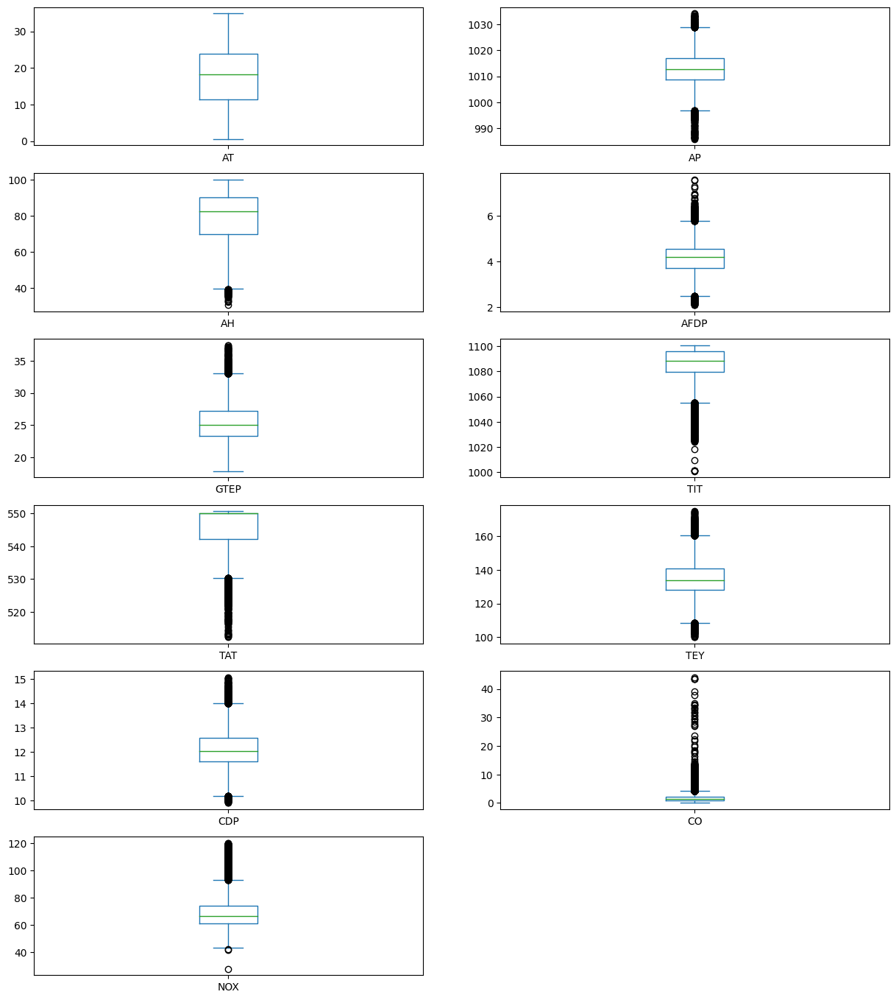

In [11]:
# Box plot find the outliers 

box_plot = gas_turbine_df.plot(kind="box",subplots=True,layout=(7,2),figsize=(15,20));

# Calculate the IQR for each variable
Q1 = gas_turbine_df.quantile(0.25)
Q3 = gas_turbine_df.quantile(0.75)
IQR = Q3 - Q1

# Set the IQR multiplier for identifying potential outliers
IQR_multiplier = 1.5  # Adjust as needed

# Get the indices of the outliers
outlier_indices = []

for col, ax in zip(gas_turbine_df.columns, box_plot):
    outliers = ((gas_turbine_df[col] < (Q1[col] - IQR_multiplier * IQR[col])) | (gas_turbine_df[col] > (Q3[col] + IQR_multiplier * IQR[col])))
    col_outlier_indices = gas_turbine_df.index[outliers]
    outlier_indices.extend(col_outlier_indices)

outlier_indices = list(set(outlier_indices))  # Remove duplicate indices

# Display the outlier indices
print("Indices of outliers from the box plots:")
print(outlier_indices)
print(len(outlier_indices))

### Using IQR to detect the outliers

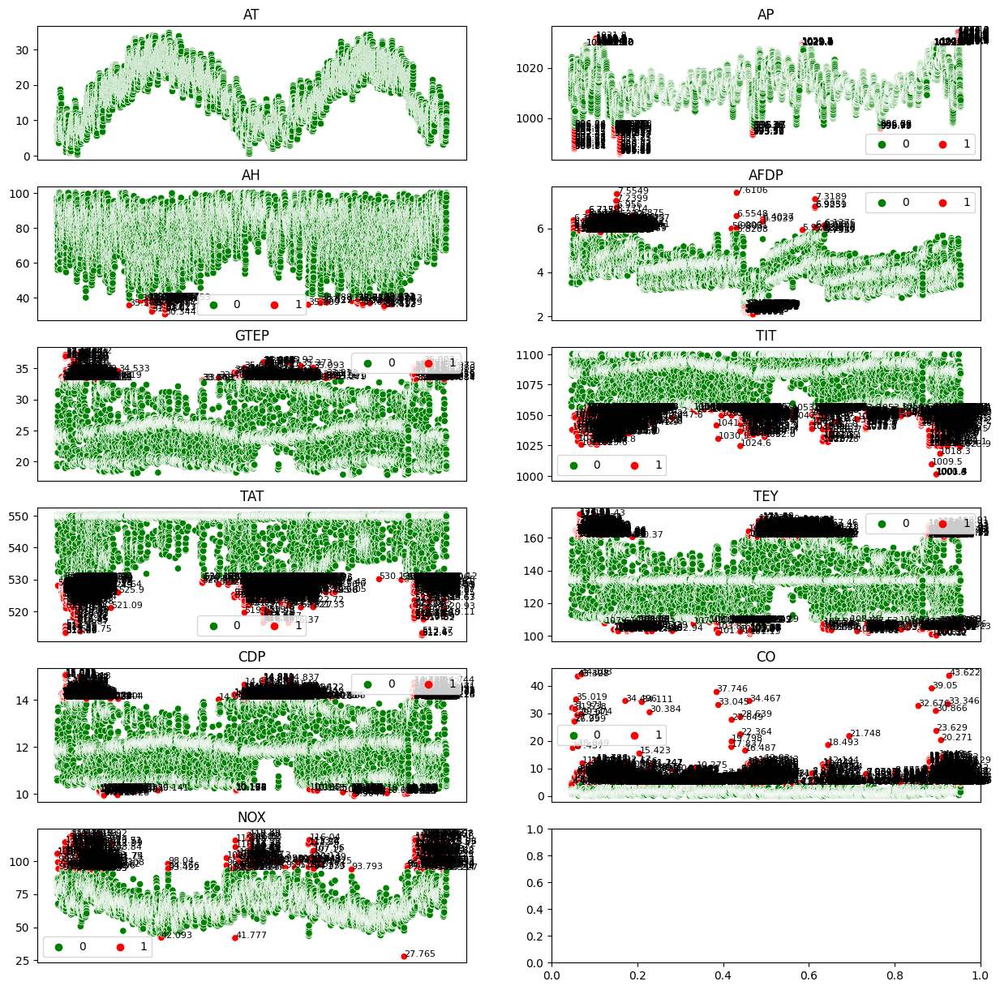

Row indices of potential outliers:
Int64Index([   23,    24,    44,    64,    94,    95,    96,    97,    98,
               99,
            ...
            15026, 15027, 15028, 15029, 15030, 15034, 15035, 15036, 15037,
            15038],
           dtype='int64', length=3687)


In [13]:
#FUNCTION TO IDENTIFY OUTLIERS USING IQR METHOD
def iqr_outlier(x,factor):
    q1 = x.quantile(0.25)
    q3 = x.quantile(0.75)
    iqr = q3 - q1
    min_ = q1 - factor * iqr
    max_ = q3 + factor * iqr
    result_ = pd.Series([0] * len(x))
    result_[((x < min_) | (x > max_))] = 1
    return result_
#SCATTER PLOTS HIGHLIGHTING OUTLIERS CALCULATED USING IQR METHOD
fig, ax = plt.subplots(6, 2, figsize=(15, 15))
row = col = 0
for n,i in enumerate(gas_turbine_df.columns):
    if (n % 2 == 0) & (n > 0):
        row += 1
        col = 0
    outliers = iqr_outlier(gas_turbine_df[i], 1.5)
   
   
    if sum(outliers) == 0:
        sns.scatterplot(x = np.arange(len(gas_turbine_df[i])), y = gas_turbine_df[i], ax = ax[row, col], legend=False, color = 'green')
    else:
        sns.scatterplot(x = np.arange(len(gas_turbine_df[i])), y = gas_turbine_df[i], ax = ax[row, col], hue = outliers, palette = ['green','red'])
    for x,y in zip(np.arange(len(gas_turbine_df[i]))[outliers == 1], gas_turbine_df[i][outliers == 1]):
        ax[row,col].text(x = x, y = y, s = y, fontsize = 8)
    ax[row,col].set_ylabel("")
    ax[row,col].set_title(i)
    ax[row,col].xaxis.set_visible(False)
    if sum(outliers) > 0:
        ax[row,col].legend(ncol=2)
    col += 1
plt.show()

# Calculate the IQR for each variable
Q1 = gas_turbine_df.quantile(0.25)
Q3 = gas_turbine_df.quantile(0.75)
IQR = Q3 - Q1

# Set the IQR multiplier for identifying potential outliers
IQR_multiplier = 1.5  # Adjust as needed

# Identify potential outliers based on the IQR method
outliers = ((gas_turbine_df < (Q1 - IQR_multiplier * IQR)) | (gas_turbine_df > (Q3 + IQR_multiplier * IQR)))

# Get the row indices of potential outliers
row_indices = gas_turbine_df.index[outliers.any(axis=1)]

# Print the row indices of potential outliers
print("Row indices of potential outliers:")
print(row_indices)

### Using Z-Scores to detect the outliers

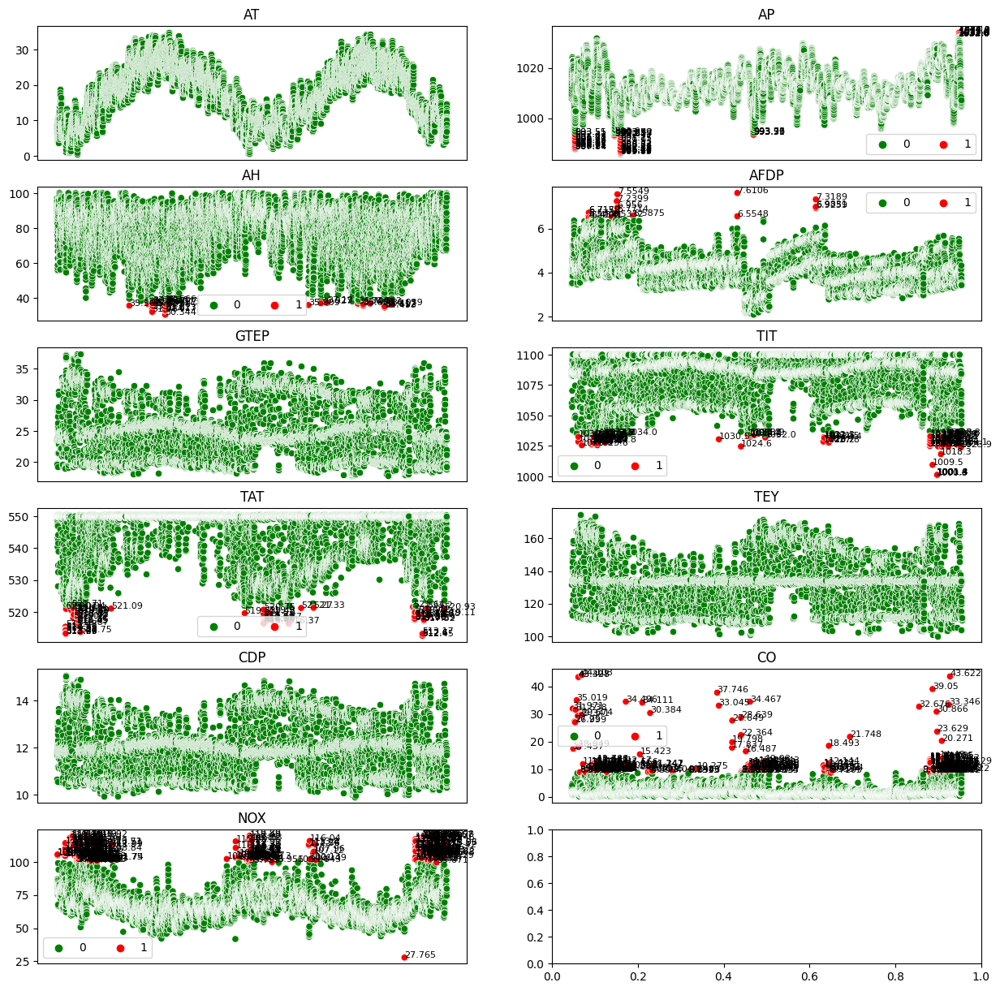

In [15]:
#FUNCTION TO DETECT OUTLIERS USING Z-SCORE METHOD
def zscore_outlier(x,lb,ub):
    zscore = ((x - x.mean()) / x.std()).copy()
    result_ = pd.Series([0] * len(x))
    result_[((zscore < lb) | (zscore > ub))] = 1
    return result_
#PLOTTING A SCATTER PLOT AND HIGHLIGHTING THE OUTLIERS DETECTED BY Z-SCORE METHOD
fig, ax = plt.subplots(6, 2, figsize=(15, 15))
row = col = 0
for n,i in enumerate(gas_turbine_df.columns):
    if (n % 2 == 0) & (n > 0):
        row += 1
        col = 0
    outliers = zscore_outlier(gas_turbine_df[i], -3, 3)
   
    if sum(outliers) == 0:
        sns.scatterplot(x = np.arange(len(gas_turbine_df[i])), y = gas_turbine_df[i], ax = ax[row, col], legend=False, color = 'green')
    else:
        sns.scatterplot(x = np.arange(len(gas_turbine_df[i])), y = gas_turbine_df[i], ax = ax[row, col], hue = outliers, palette = ['green','red'])
    for x,y in zip(np.arange(len(gas_turbine_df[i]))[outliers == 1], gas_turbine_df[i][outliers == 1]):
        ax[row,col].text(x = x, y = y, s = y, fontsize = 8)
    ax[row,col].set_ylabel("")
    ax[row,col].set_title(i)
    ax[row,col].xaxis.set_visible(False)
    if sum(outliers) > 0:
        ax[row,col].legend(ncol=2)
    col += 1

plt.show()


### Even though the outlier methods shows so many records as outliers, from the domain knowleage we can say that records are in the reasonable range and none of the value is negative. Hence no outlier treatment is required.

In [16]:
# Correlation matrix to check the multi collinearity of the features
gas_turbine_df.corr()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
AT,1.000000,-0.412953,-0.549432,-0.099333,-0.049103,0.093067,0.338569,-0.207495,-0.100705,-0.088588,-0.600006
AP,-0.412953,1.000000,0.042573,0.040318,0.078575,0.029650,-0.223479,0.146939,0.131198,0.041614,0.256744
AH,-0.549432,0.042573,1.000000,-0.119249,-0.202784,-0.247781,0.010859,-0.110272,-0.182010,0.165505,0.143061
AFDP,-0.099333,0.040318,-0.119249,1.000000,0.744251,0.627254,-0.571541,0.717995,0.727152,-0.334207,-0.037299
GTEP,-0.049103,0.078575,-0.202784,0.744251,1.000000,0.874526,-0.756884,0.977042,0.993784,-0.508259,-0.208496
TIT,0.093067,0.029650,-0.247781,0.627254,0.874526,1.000000,-0.357320,0.891587,0.887238,-0.688272,-0.231636
TAT,0.338569,-0.223479,0.010859,-0.571541,-0.756884,-0.357320,1.000000,-0.720356,-0.744740,0.063404,0.009888
TEY,-0.207495,0.146939,-0.110272,0.717995,0.977042,0.891587,-0.720356,1.000000,0.988473,-0.541751,-0.102631
CDP,-0.100705,0.131198,-0.182010,0.727152,0.993784,0.887238,-0.744740,0.988473,1.000000,-0.520783,-0.169103
CO,-0.088588,0.041614,0.165505,-0.334207,-0.508259,-0.688272,0.063404,-0.541751,-0.520783,1.000000,0.316743


<AxesSubplot: >

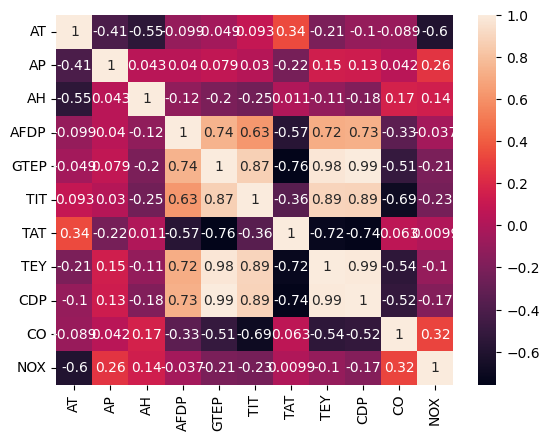

In [17]:
# Heatmaps for the given dataset.
sns.heatmap(gas_turbine_df.corr(), annot=True)

### Correlation between TEY and CDP is 0.99, between GTEP and CDP is 0.99 and between TEY and GTEP is 0.98. But TEY is the target variable. So this shows that GTEP AND CDP are significant variable with respect to output variable. But there is high correlation between GTEP AND CDP. Hence these features may create multicolinearity. Hence we need to drop each feature and check the accuracy of each model.

In [18]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Calculate VIF for each feature
def calculate_vif(data_frame):
    vif_data = pd.DataFrame()
    vif_data["feature"] = data_frame.columns
    vif_data["VIF"] = [variance_inflation_factor(data_frame.values, i) for i in range(data_frame.shape[1])]
    return vif_data

vif_results = calculate_vif(gas_turbine_df)  
print("VIF Results:")
print(vif_results)

VIF Results:
   feature           VIF
0       AT  8.805473e+01
1       AP  4.830884e+04
2       AH  6.987916e+01
3     AFDP  8.614393e+01
4     GTEP  1.262297e+04
5      TIT  2.079083e+06
6      TAT  1.090503e+06
7      TEY  2.324930e+04
8      CDP  3.970243e+04
9       CO  4.018944e+00
10     NOX  1.084290e+02


### VIF value for all the features is very high.

### Creating dataframe by dropping CDP.

In [21]:
# GTEP dataframe

gtep_df = gas_turbine_df[["AT", "AP", "AH", "AFDP", "GTEP", "TIT", "TAT", "CO", "NOX", "TEY"]]

In [22]:
gtep_df.head(2)

,AT,AP,AH,AFDP,GTEP,TIT,TAT,CO,NOX,TEY
0,6.8594,1007.9,96.799,3.5000,19.663,1059.2,550.0,3.1547,82.722,114.70
1,6.7850,1008.4,97.118,3.4998,19.728,1059.3,550.0,3.2363,82.776,114.72


### Creating dataframe by dropping GTEP. 

In [23]:
# CDP dataframe

cdp_df = gas_turbine_df[["AT", "AP", "AH", "AFDP", "CDP", "TIT", "TAT", "CO", "NOX", "TEY"]]

In [24]:
cdp_df.head(2)

,AT,AP,AH,AFDP,CDP,TIT,TAT,CO,NOX,TEY
0,6.8594,1007.9,96.799,3.5000,10.605,1059.2,550.0,3.1547,82.722,114.70
1,6.7850,1008.4,97.118,3.4998,10.598,1059.3,550.0,3.2363,82.776,114.72


### Correlation matrix for GTEP dataframe. 

In [25]:
# Correlation matrix to check the multi collinearity of the features
gtep_df.corr()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,CO,NOX,TEY
AT,1.000000,-0.412953,-0.549432,-0.099333,-0.049103,0.093067,0.338569,-0.088588,-0.600006,-0.207495
AP,-0.412953,1.000000,0.042573,0.040318,0.078575,0.029650,-0.223479,0.041614,0.256744,0.146939
AH,-0.549432,0.042573,1.000000,-0.119249,-0.202784,-0.247781,0.010859,0.165505,0.143061,-0.110272
AFDP,-0.099333,0.040318,-0.119249,1.000000,0.744251,0.627254,-0.571541,-0.334207,-0.037299,0.717995
GTEP,-0.049103,0.078575,-0.202784,0.744251,1.000000,0.874526,-0.756884,-0.508259,-0.208496,0.977042
TIT,0.093067,0.029650,-0.247781,0.627254,0.874526,1.000000,-0.357320,-0.688272,-0.231636,0.891587
TAT,0.338569,-0.223479,0.010859,-0.571541,-0.756884,-0.357320,1.000000,0.063404,0.009888,-0.720356
CO,-0.088588,0.041614,0.165505,-0.334207,-0.508259,-0.688272,0.063404,1.000000,0.316743,-0.541751
NOX,-0.600006,0.256744,0.143061,-0.037299,-0.208496,-0.231636,0.009888,0.316743,1.000000,-0.102631
TEY,-0.207495,0.146939,-0.110272,0.717995,0.977042,0.891587,-0.720356,-0.541751,-0.102631,1.000000


<AxesSubplot: >

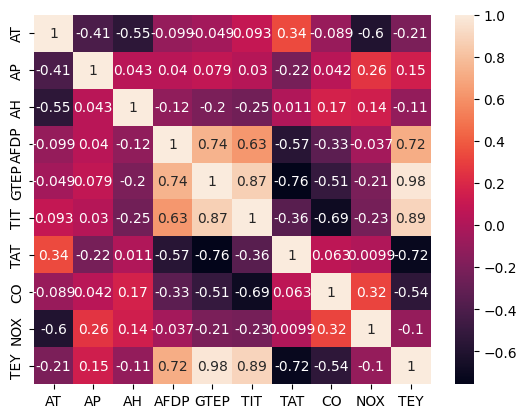

In [26]:
# Heatmaps for the given dataset.
sns.heatmap(gtep_df.corr(), annot=True)

In [32]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Calculate VIF for each feature
def calculate_vif(data_frame):
    vif_data = pd.DataFrame()
    vif_data["feature"] = data_frame.columns
    vif_data["VIF"] = [variance_inflation_factor(data_frame.values, i) for i in range(data_frame.shape[1])]
    return vif_data

vif_results = calculate_vif(gtep_df)  
print("VIF Results:")
print(vif_results)

VIF Results:
  feature           VIF
0      AT  8.671782e+01
1      AP  4.822712e+04
2      AH  6.986681e+01
3    AFDP  8.609427e+01
4    GTEP  1.262152e+04
5     TIT  1.586500e+06
6     TAT  8.010511e+05
7      CO  4.018674e+00
8     NOX  1.084094e+02
9     TEY  2.259275e+04


### Correlation matrix for CDP dataframe.

In [27]:
# Correlation matrix to check the multi collinearity of the features
cdp_df.corr()

,AT,AP,AH,AFDP,CDP,TIT,TAT,CO,NOX,TEY
AT,1.000000,-0.412953,-0.549432,-0.099333,-0.100705,0.093067,0.338569,-0.088588,-0.600006,-0.207495
AP,-0.412953,1.000000,0.042573,0.040318,0.131198,0.029650,-0.223479,0.041614,0.256744,0.146939
AH,-0.549432,0.042573,1.000000,-0.119249,-0.182010,-0.247781,0.010859,0.165505,0.143061,-0.110272
AFDP,-0.099333,0.040318,-0.119249,1.000000,0.727152,0.627254,-0.571541,-0.334207,-0.037299,0.717995
CDP,-0.100705,0.131198,-0.182010,0.727152,1.000000,0.887238,-0.744740,-0.520783,-0.169103,0.988473
TIT,0.093067,0.029650,-0.247781,0.627254,0.887238,1.000000,-0.357320,-0.688272,-0.231636,0.891587
TAT,0.338569,-0.223479,0.010859,-0.571541,-0.744740,-0.357320,1.000000,0.063404,0.009888,-0.720356
CO,-0.088588,0.041614,0.165505,-0.334207,-0.520783,-0.688272,0.063404,1.000000,0.316743,-0.541751
NOX,-0.600006,0.256744,0.143061,-0.037299,-0.169103,-0.231636,0.009888,0.316743,1.000000,-0.102631
TEY,-0.207495,0.146939,-0.110272,0.717995,0.988473,0.891587,-0.720356,-0.541751,-0.102631,1.000000


<AxesSubplot: >

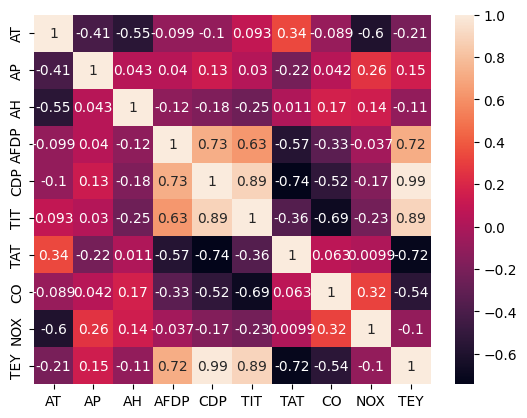

In [28]:
# Heatmaps for the given dataset.
sns.heatmap(cdp_df.corr(), annot=True)

In [33]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Calculate VIF for each feature
def calculate_vif(data_frame):
    vif_data = pd.DataFrame()
    vif_data["feature"] = data_frame.columns
    vif_data["VIF"] = [variance_inflation_factor(data_frame.values, i) for i in range(data_frame.shape[1])]
    return vif_data

vif_results = calculate_vif(cdp_df)  
print("VIF Results:")
print(vif_results)

VIF Results:
  feature           VIF
0      AT  8.617148e+01
1      AP  4.206210e+04
2      AH  6.970374e+01
3    AFDP  7.067806e+01
4     CDP  3.969788e+04
5     TIT  1.192522e+06
6     TAT  5.562658e+05
7      CO  3.997280e+00
8     NOX  1.060593e+02
9     TEY  2.272587e+04


## Distribution of GTEP dataframe. 

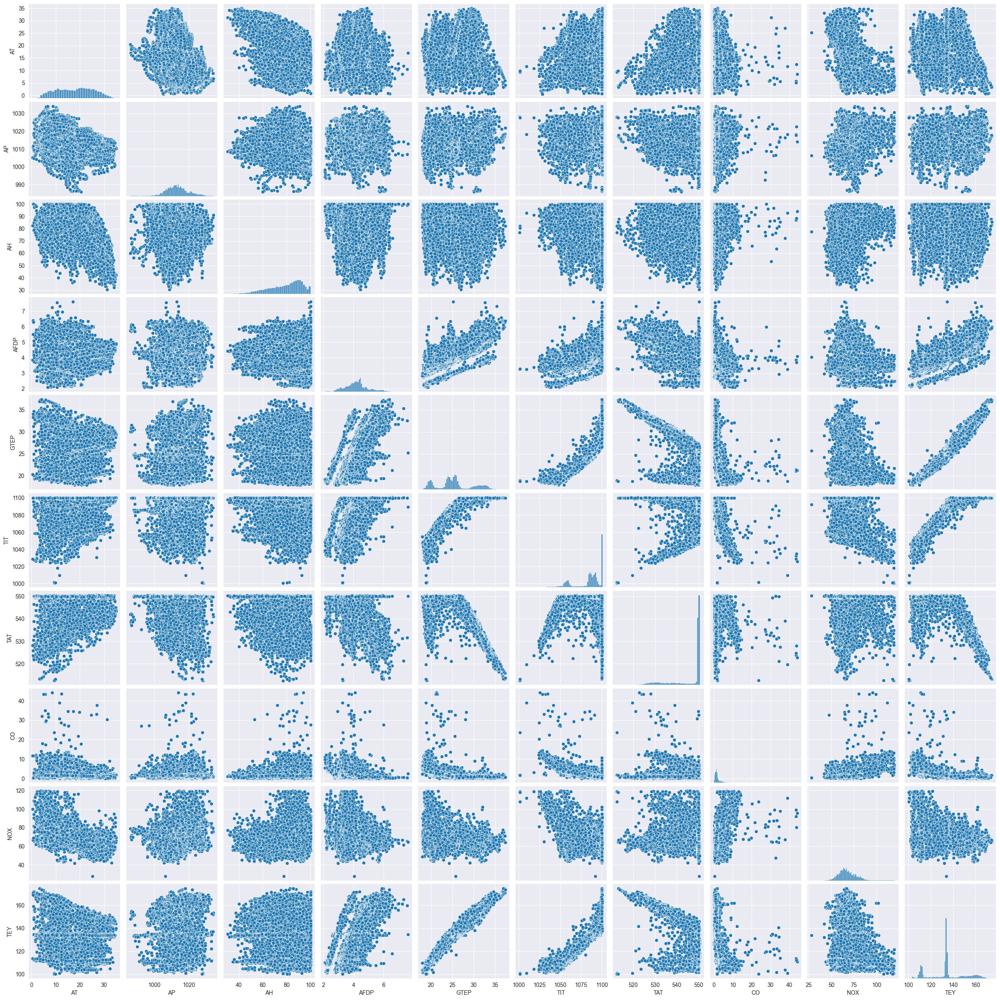

In [29]:
# Drawing Histogram to check the distribution of the data.
#Format the plot background and scatter plots for all the variables
sns.set_style(style='darkgrid')
sns.pairplot(gtep_df)

### Most of the histogram shows that the features are not normally distributed.

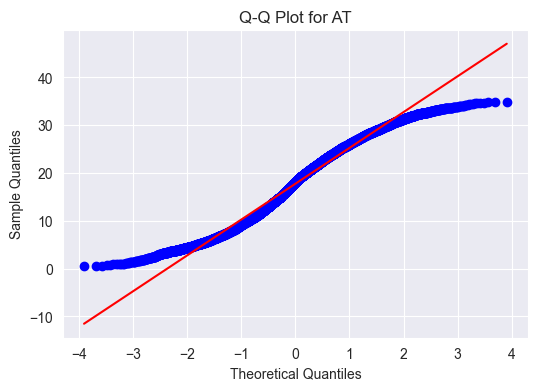

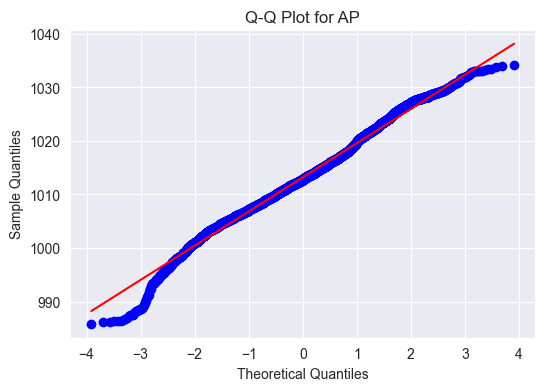

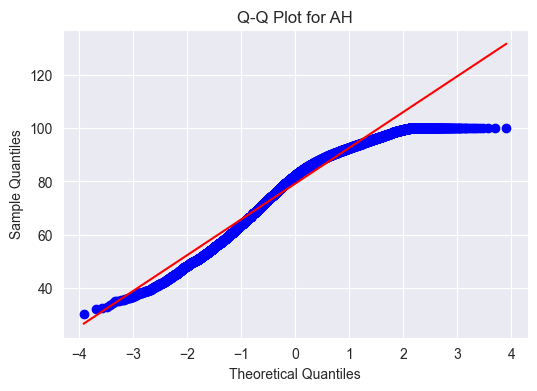

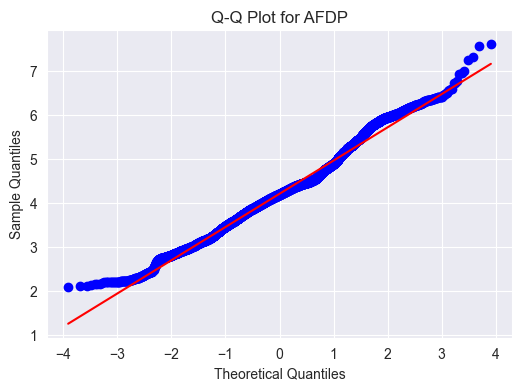

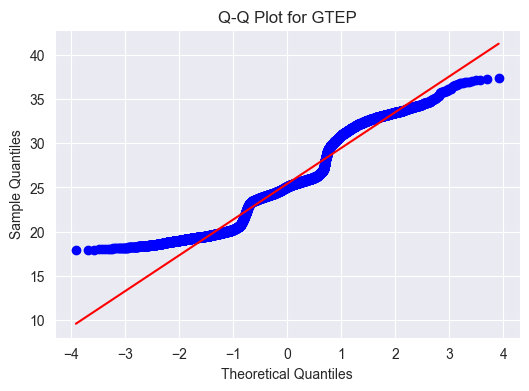

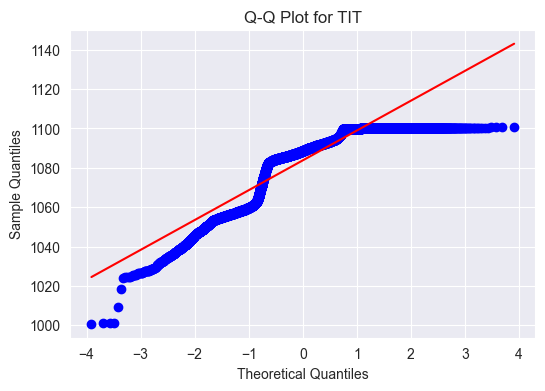

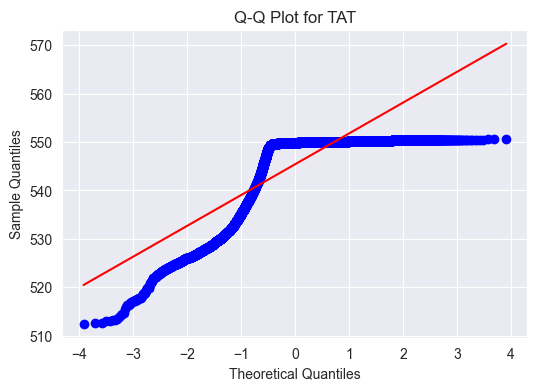

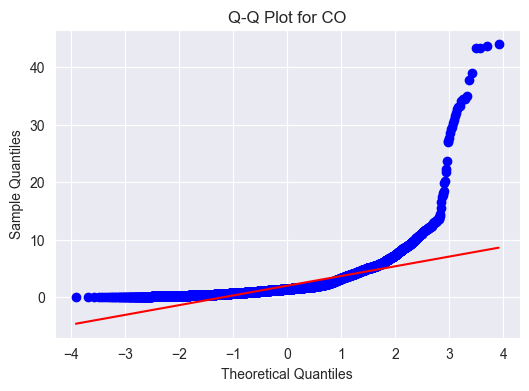

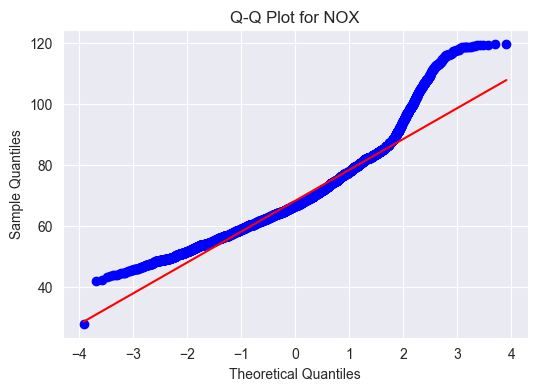

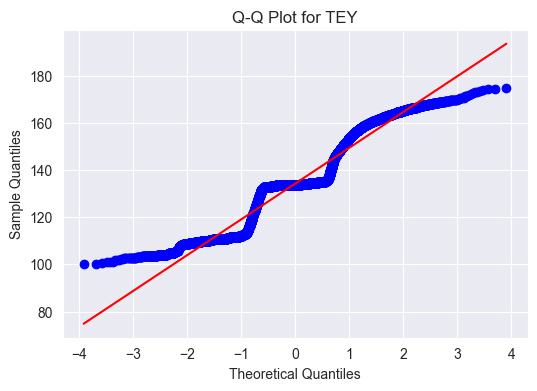

In [30]:
# Using Q-Q plot for checking the data distribution
# Create Q-Q plots for each variable in separate graphs
for col in gtep_df.columns:
    plt.figure(figsize=(6, 4))
    stats.probplot(gtep_df[col], dist="norm", plot=plt)
    plt.title(f"Q-Q Plot for {col}")
    plt.xlabel("Theoretical Quantiles")
    plt.ylabel("Sample Quantiles")
    plt.grid(True)
    plt.show()

###  Most of the Q-Q plot shows that features are not normally distributed.

## Distribution of GTEP dataframe. 

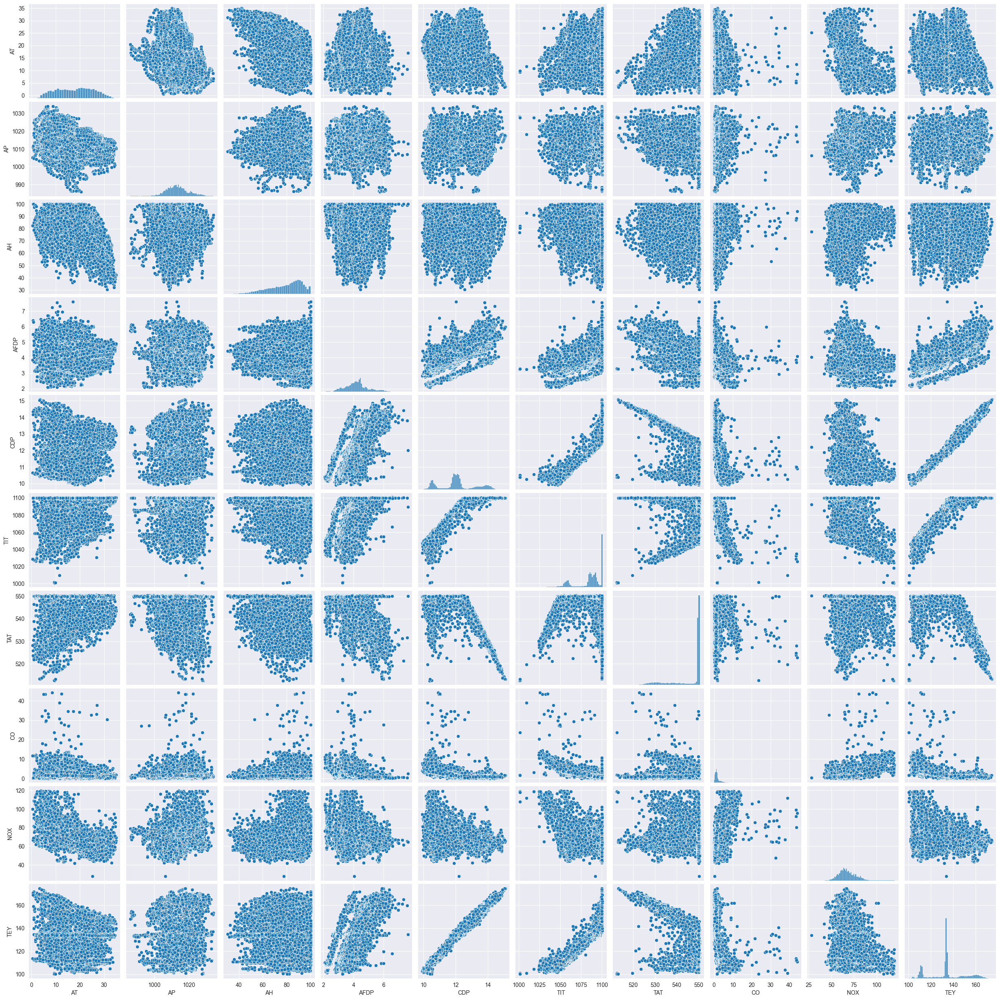

In [31]:
# Drawing Histogram to check the distribution of the data.
#Format the plot background and scatter plots for all the variables
sns.set_style(style='darkgrid')
sns.pairplot(cdp_df)

### Most of the histogram shows that the features are not normally distributed.

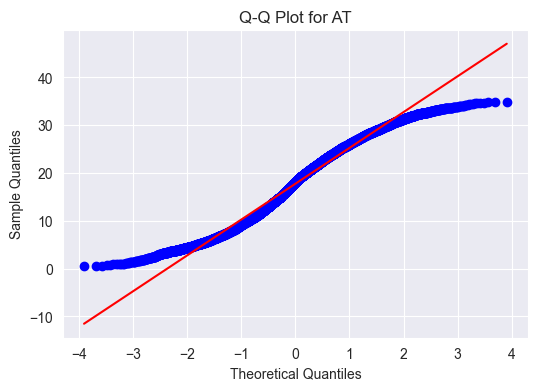

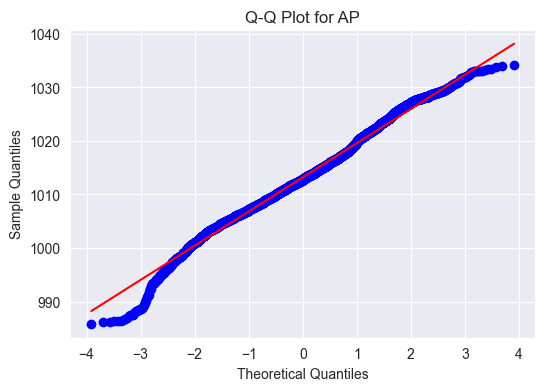

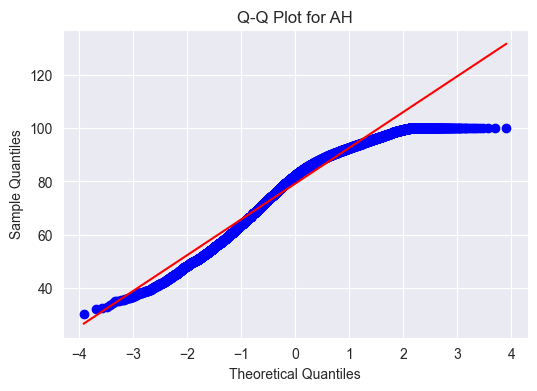

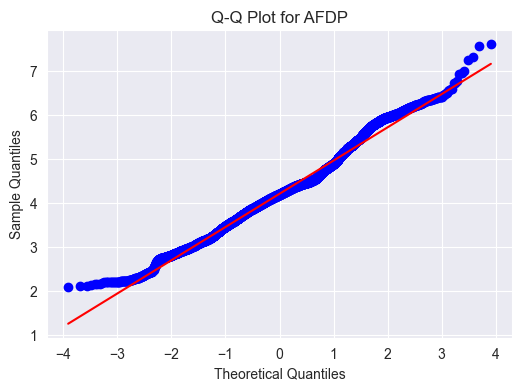

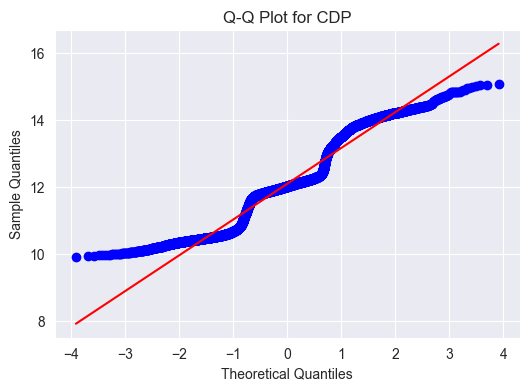

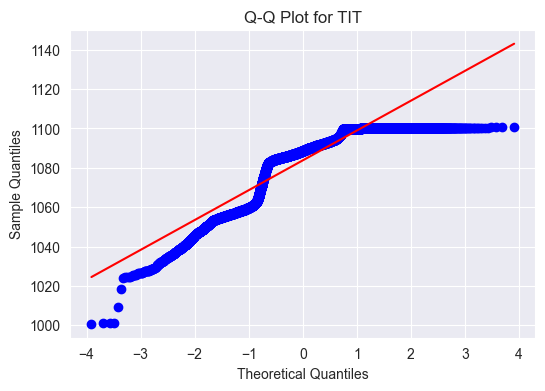

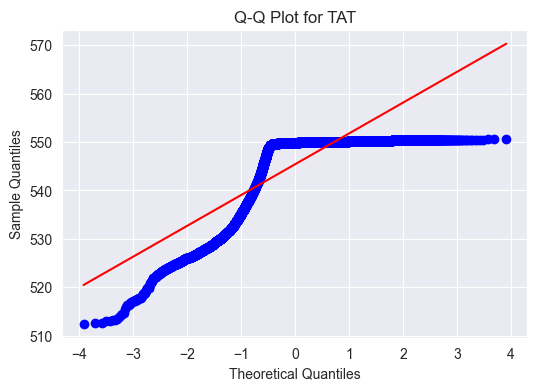

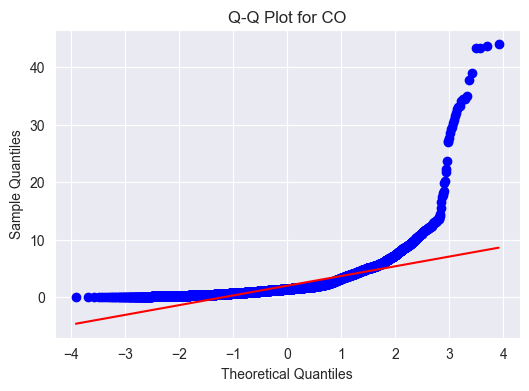

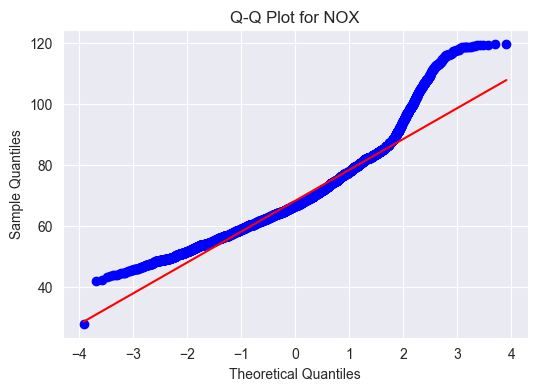

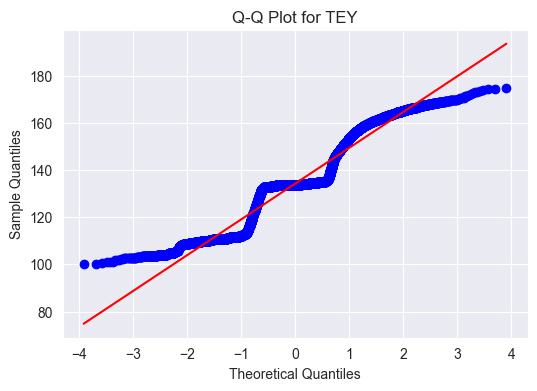

In [34]:
# Using Q-Q plot for checking the data distribution
# Create Q-Q plots for each variable in separate graphs
for col in cdp_df.columns:
    plt.figure(figsize=(6, 4))
    stats.probplot(cdp_df[col], dist="norm", plot=plt)
    plt.title(f"Q-Q Plot for {col}")
    plt.xlabel("Theoretical Quantiles")
    plt.ylabel("Sample Quantiles")
    plt.grid(True)
    plt.show()

### Most of the Q-Q plot shows that features are not normally distributed.

### Hence we can use Normalization for transformation.

In [36]:
from sklearn.preprocessing import MinMaxScaler

# Initialize the Normalization
min_max_scaler = MinMaxScaler()

# Fit and transform the data using standardization
gtep_normalized_data_minmax = min_max_scaler.fit_transform(gtep_df)


# Create a new DataFrame with the standardized data
gtep_norm_df = pd.DataFrame(gtep_normalized_data_minmax, columns = gtep_df.columns)

In [40]:
gtep_norm_df.head(5)

,AT,AP,AH,AFDP,GTEP,TIT,TAT,CO,NOX,TEY
0,0.184182,0.456050,0.951314,0.255758,0.091426,0.584,0.984015,0.071522,0.596548,0.195191
1,0.182020,0.466391,0.955881,0.255721,0.094755,0.585,0.984015,0.073372,0.597134,0.195459
2,0.185295,0.474664,0.939003,0.252571,0.097367,0.586,0.980608,0.072576,0.593791,0.195325
3,0.189922,0.482937,0.929126,0.252227,0.098033,0.588,0.983753,0.072375,0.595984,0.195459
4,0.199830,0.493278,0.927708,0.255323,0.096650,0.589,0.983491,0.073647,0.592087,0.195459


In [38]:
from sklearn.preprocessing import MinMaxScaler

# Initialize the Normalization
min_max_scaler = MinMaxScaler()

# Fit and transform the data using standardization
cdp_normalized_data_minmax = min_max_scaler.fit_transform(cdp_df)


# Create a new DataFrame with the standardized data
cdp_norm_df = pd.DataFrame(cdp_normalized_data_minmax, columns = cdp_df.columns)

In [41]:
cdp_norm_df.head(5)

,AT,AP,AH,AFDP,CDP,TIT,TAT,CO,NOX,TEY
0,0.184182,0.456050,0.951314,0.255758,0.135340,0.584,0.984015,0.071522,0.596548,0.195191
1,0.182020,0.466391,0.955881,0.255721,0.133988,0.585,0.984015,0.073372,0.597134,0.195459
2,0.185295,0.474664,0.939003,0.252571,0.134567,0.586,0.980608,0.072576,0.593791,0.195325
3,0.189922,0.482937,0.929126,0.252227,0.135533,0.588,0.983753,0.072375,0.595984,0.195459
4,0.199830,0.493278,0.927708,0.255323,0.136692,0.589,0.983491,0.073647,0.592087,0.195459


## Model building

In [42]:
# Importing train - test split , K-fold Cross validation and accuracy score and classification report 

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import StratifiedKFold, cross_val_score

In [47]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

# Separate features (X) and target variable (y)
X1 = gtep_norm_df.drop('TEY', axis=1)
y1 = gtep_norm_df['TEY']

# Split your data into training and testing sets
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, test_size=0.2, random_state=42)

# 2. Define the neural network architecture for regression
model1 = keras.Sequential([
    keras.layers.Input(shape=(X_train1.shape[1],)),  # Input layer
    keras.layers.Dense(64, activation='relu'),      # Hidden layer with 64 neurons and ReLU activation
    keras.layers.Dense(32, activation='relu'),      # Another hidden layer with 32 neurons and ReLU activation
    keras.layers.Dense(1)                           # Output layer with 1 neuron (regression)
])

# 3. Compile the model for regression
model1.compile(optimizer='adam',
              loss='mean_squared_error',  # Mean Squared Error (MSE) loss for regression
              metrics=['mean_absolute_error'])  # Optional: you can add metrics like Mean Absolute Error (MAE)

# 4. Train the regression model
model1.fit(X_train1, y_train1, epochs=10, batch_size=32, validation_split=0.2)

# 5. Evaluate the regression model on the test set
y_pred1 = model1.predict(X_test1)

# Calculate evaluation metrics for regression
mse = mean_squared_error(y_test1, y_pred1)
r2 = r2_score(y_test1, y_pred1)

print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"R-squared (R2): {r2:.2f}")


Epoch 1/10
301/301 [==============================] - 1s 2ms/step - loss: 0.0262 - mean_absolute_error: 0.0769 - val_loss: 1.7031e-04 - val_mean_absolute_error: 0.0093
Epoch 2/10
301/301 [==============================] - 1s 2ms/step - loss: 1.5262e-04 - mean_absolute_error: 0.0090 - val_loss: 1.0724e-04 - val_mean_absolute_error: 0.0076
Epoch 3/10
301/301 [==============================] - 1s 2ms/step - loss: 1.1949e-04 - mean_absolute_error: 0.0081 - val_loss: 9.2410e-05 - val_mean_absolute_error: 0.0072
Epoch 4/10
301/301 [==============================] - 1s 2ms/step - loss: 1.0681e-04 - mean_absolute_error: 0.0076 - val_loss: 9.4480e-05 - val_mean_absolute_error: 0.0071
Epoch 5/10
301/301 [==============================] - 1s 2ms/step - loss: 1.0764e-04 - mean_absolute_error: 0.0077 - val_loss: 8.5239e-05 - val_mean_absolute_error: 0.0068
Epoch 6/10
301/301 [==============================] - 1s 2ms/step - loss: 1.0008e-04 - mean_absolute_error: 0.0074 - val_loss: 9.6309e-05 - val_

In [50]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

# Separate features (X) and target variable (y)
X2 = cdp_norm_df.drop('TEY', axis=1)
y2 = cdp_norm_df['TEY']

# Split your data into training and testing sets
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=0.2, random_state=42)

# 2. Define the neural network architecture for regression
model2 = keras.Sequential([
    keras.layers.Input(shape=(X_train2.shape[1],)),  # Input layer
    keras.layers.Dense(64, activation='relu'),      # Hidden layer with 64 neurons and ReLU activation
    keras.layers.Dense(32, activation='relu'),      # Another hidden layer with 32 neurons and ReLU activation
    keras.layers.Dense(1)                           # Output layer with 1 neuron (regression)
])

# 3. Compile the model for regression
model2.compile(optimizer='adam',
              loss='mean_squared_error',  # Mean Squared Error (MSE) loss for regression
              metrics=['mean_absolute_error'])  # Optional: you can add metrics like Mean Absolute Error (MAE)

# 4. Train the regression model
model2.fit(X_train2, y_train2, epochs=10, batch_size=32, validation_split=0.2)

# 5. Evaluate the regression model on the test set
y_pred2 = model2.predict(X_test2)

# Calculate evaluation metrics for regression
mse = mean_squared_error(y_test2, y_pred2)
r2 = r2_score(y_test2, y_pred2)

print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"R-squared (R2): {r2:.2f}")

Epoch 1/10
301/301 [==============================] - 1s 2ms/step - loss: 0.0068 - mean_absolute_error: 0.0378 - val_loss: 1.7276e-04 - val_mean_absolute_error: 0.0097
Epoch 2/10
301/301 [==============================] - 1s 2ms/step - loss: 1.5674e-04 - mean_absolute_error: 0.0095 - val_loss: 1.2658e-04 - val_mean_absolute_error: 0.0086
Epoch 3/10
301/301 [==============================] - 1s 2ms/step - loss: 1.3304e-04 - mean_absolute_error: 0.0089 - val_loss: 1.0853e-04 - val_mean_absolute_error: 0.0078
Epoch 4/10
301/301 [==============================] - 1s 2ms/step - loss: 1.3577e-04 - mean_absolute_error: 0.0090 - val_loss: 1.1710e-04 - val_mean_absolute_error: 0.0083
Epoch 5/10
301/301 [==============================] - 1s 2ms/step - loss: 1.2724e-04 - mean_absolute_error: 0.0087 - val_loss: 9.9931e-05 - val_mean_absolute_error: 0.0077
Epoch 6/10
301/301 [==============================] - 1s 2ms/step - loss: 1.1462e-04 - mean_absolute_error: 0.0082 - val_loss: 1.1890e-04 - val_